In [1]:
import glob
import numpy as np
import matplotlib.pyplot as plt
import nrrd
import os
import pandas as pd
import random
import splitfolders

from scipy import ndimage
from skimage.util import montage

In [2]:
IMG_WIDTH = 256
IMG_HEIGTH = 256
IMG_DEPTH = 32
MIN_HU_VALUE = -1000
MAX_HU_VALUE = 400

In [3]:
# Source directory of images and masks
EXAMS_DIR = "/home/mainlab1/TCCPauloLucas/data/images/"
MASKS_DIR = "/home/mainlab1/TCCPauloLucas/data/masks/"
# Directory where the mask and image slices are saved
SLICES_DATA_DIR = "sampled_slices_data"
# Directory where the train, test and validation files are saved after the split
SPLITTED_DATA_DIR = "sampled_splitted_data"
# Decides if all slices will be saved or only the ones with nodules
NODULE_SLICES_ONLY = True
# Number of slices without nodules per exam
NOF_NO_NODULE_SLICES = 1
# Train and test directories
TRAIN_IMG_DIR = f"{SPLITTED_DATA_DIR}/train/images/"
TRAIN_MASK_DIR = f"{SPLITTED_DATA_DIR}/train/masks/"

In [4]:
# Source directory of images and masks
EXAMS_DIR = "./LIDC-IDRI_data/images/"
MASKS_DIR = "./LIDC-IDRI_data/masks/"
# Directory where the mask and image slices are saved
SLICES_DATA_DIR = "LIDC-IDRI_slices_data"
# Directory where the train, test and validation files are saved after the split
SPLITTED_DATA_DIR = "LIDC-IDRI_splitted_slices_data"
# Decides if all slices will be saved or only the ones with nodules
NODULE_SLICES_ONLY = True
# Number of slices without nodules per exam
NOF_NO_NODULE_SLICES = 1
# Train and test directories
TRAIN_IMG_DIR = f"{SPLITTED_DATA_DIR}/train/images/"
TRAIN_MASK_DIR = f"{SPLITTED_DATA_DIR}/train/masks/"

In [5]:
def get_nrrd_data(path):
    # load image from file
    ct_data, ct_header = nrrd.read(path)
    # Get spacing
    ct_spacing = np.asarray([ct_header['space directions'][0, 0],
                             ct_header['space directions'][1, 1],
                             ct_header['space directions'][2, 2]])
    return ct_data, ct_spacing

In [6]:
# Source: https://keras.io/examples/vision/3D_image_classification/

def crop_volume(volume, left, top, right, bottom):
    # Remove the background
    croped_volume = volume[:,top:-bottom,
                left:-right]
    return croped_volume

def normalize(volume):
    """Normalize the volume"""
    min = MIN_HU_VALUE
    max = MAX_HU_VALUE
    volume[volume < min] = min
    volume[volume > max] = max
    volume = (volume - min) / (max - min)
    return volume

def resize_volume(volume, resize_z_axis=True):
    """Resize across z-axis"""
#     print(f"pre-transpose {volume.shape}")
    volume = volume.transpose(1,2,0)
#     print(f"post-transpose {volume.shape}")
    # Set the desired depth
    desired_depth = IMG_DEPTH
    desired_width = IMG_WIDTH
    desired_height = IMG_HEIGTH
    # Get current depth
    current_depth = volume.shape[-1]
    current_width = volume.shape[0]
    current_height = volume.shape[1]
    # Compute depth factor
    depth = current_depth / desired_depth
    width = current_width / desired_width
    height = current_height / desired_height
    depth_factor = 1 / depth
    width_factor = 1 / width
    height_factor = 1 / height
    # Resize across z-axis
    if not resize_z_axis:
        depth_factor = 1
    volume = ndimage.zoom(volume, (width_factor, height_factor, depth_factor), mode='nearest', order=1)
    return volume

def process_scan(volume, is_image=True, resize_z_axis=True):
    """Read and resize volume"""
    # Crop image
    volume = crop_volume(volume, 50, 10, 50, 90)
    # Resize width, height and depth
    volume = resize_volume(volume, resize_z_axis)
    # Normalize only the images
    if is_image:
        # Normalize
        volume = normalize(volume)
    #Cast to float32
    volume = volume.astype("float32")
    return volume

In [7]:
# exam_files = os.listdir(exams_dir)
# mask_files = os.listdir(masks_dir)

# indexes = {}

# for mask_idx, mask in enumerate(mask_files):
#     mask_path = masks_dir + mask
#     indexes[mask_idx] = []
#     if mask.endswith(".nrrd"):
#         volume, _ = get_nrrd_data(mask_path)
#         for slice_idx, each_slice in enumerate(volume.transpose(2,0,1)):
#             if each_slice.any():
#                 indexes[mask_idx] += [slice_idx]
                

In [8]:
# Deletes all mask and image files on SLICES_DATA_DIR
files = []
for data_type in ['images','masks']:
    files += glob.glob(f'{SLICES_DATA_DIR}/{data_type}/*') + glob.glob(f'{SLICES_DATA_DIR}/{data_type}/*')
for f in files:
    os.remove(f)

In [9]:
# Check whether the specified paths exists or not
for path in [f'./{SLICES_DATA_DIR}/masks/', f'./{SLICES_DATA_DIR}/images/']:
    exist = os.path.exists(path)
    if not exist:
        # Creates a new directory because it does not exist 
        os.makedirs(path)
        print(f'Directory "{path}" has been created!')

In [27]:
mask_path

'./LIDC-IDRI_data/masks/LIDC-IDRI-0099.npy'

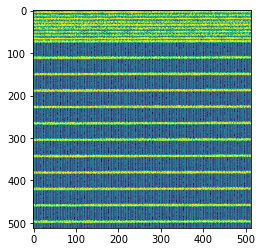

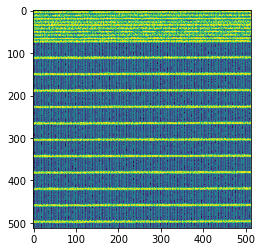

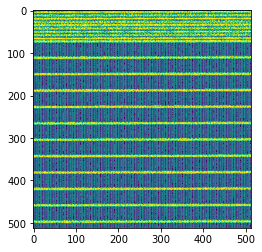

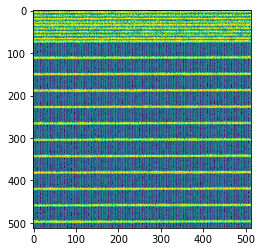

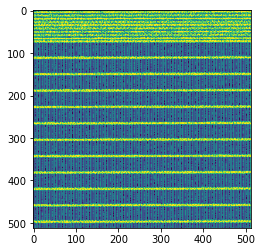

...

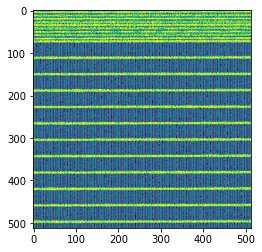

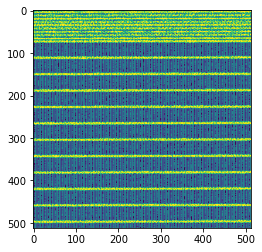

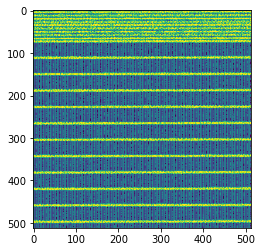

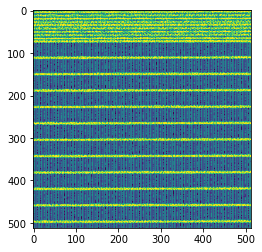

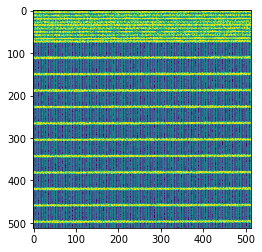

In [29]:
volume = np.load('./LIDC-IDRI_data/masks/LIDC-IDRI-0250.npy').astype("int16")
volume_T = volume.transpose(2,0,1)
for slice_idx, each_slice in enumerate(volume_T):
    if each_slice.any():
        plt.imshow(each_slice)
        plt.show()

In [12]:
mask_files = os.listdir(MASKS_DIR)

indexes = {}
random_slices_dict = {}

for mask_idx, mask in enumerate(mask_files):
    mask_path = MASKS_DIR + mask
    file_name = mask.split('.')[0]
    indexes[mask_idx] = []
    random_slices_dict[mask_idx] = []
    if mask.endswith(".nrrd"):
        volume, _ = get_nrrd_data(mask_path)
        volume = process_scan(volume.T, is_image=False, resize_z_axis=False)
    elif mask.endswith(".npy"):
        volume = np.load(mask_path).astype("int16")
        volume = process_scan(volume.transpose(2,0,1), is_image=False, resize_z_axis=False)
    else:
        break  
    no_slices = volume.shape[2]
    # Checks if the masks only have only ones and zeros after processing
    try:
        assert (np.array_equal(np.unique(volume), np.array([0.,1.])) or np.array_equal(np.unique(volume), np.array([0.])))
    except AssertionError:
        print(f"Mask file path: {mask_path}, unique values: {np.unique(volume)}")
    volume_T = volume.transpose(2,0,1)
    # Iterates over each slice of the loaded volume
    for slice_idx, each_slice in enumerate(volume_T):
        if NODULE_SLICES_ONLY:
            if each_slice.any():
                # Gets only slices with nodules
                np.save(f'./{SLICES_DATA_DIR}/masks/{file_name}-{slice_idx}.npy', each_slice)
                # Saves the index of the slice with nodules
                indexes[mask_idx] += [slice_idx]
            if slice_idx == no_slices - 1:
                # Gets NUMBER_OF_NO_NODULE_SLICES random slices without nodules
                random_slices = np.random.choice(list(set([x for x in range(no_slices)]) - set(indexes[mask_idx])), NOF_NO_NODULE_SLICES)
                for random_slice_idx in random_slices:
                    random_slices_dict[mask_idx] += [random_slice_idx]
                    random_slice = volume_T[random_slice_idx]
                    np.save(f'./{SLICES_DATA_DIR}/masks/{file_name}-{random_slice_idx}.npy', random_slice)
        else:
            np.save(f'./{SLICES_DATA_DIR}/masks/{file_name}-{slice_idx}.npy', each_slice)

ValueError: 'a' cannot be empty unless no samples are taken

In [ ]:
exam_files = os.listdir(EXAMS_DIR)

for exam_idx, exam in enumerate(exam_files):
    exam_path = EXAMS_DIR + exam
    file_name = exam.split('.')[0]
    if exam.endswith(".nrrd"):
        volume, _ = get_nrrd_data(exam_path)
        volume = process_scan(volume.T, is_image=True, resize_z_axis=False)
    elif mask.endswith(".npy"):
        volume = np.load(exam_path).astype("int16")
        volume = process_scan(volume.transpose(2,0,1), is_image=True, resize_z_axis=False)
    else:
        break
    no_slices = volume.shape[2]
    volume_T = volume.transpose(2,0,1)
    for slice_idx, each_slice in enumerate(volume_T):
        if NODULE_SLICES_ONLY: 
            if slice_idx in indexes[exam_idx]:
                np.save(f'./{SLICES_DATA_DIR}/images/{file_name}-{slice_idx}.npy', each_slice)
            if slice_idx == no_slices - 1:
                for random_slice_idx in random_slices_dict[exam_idx]:
                    random_slice = volume_T[random_slice_idx]
                    np.save(f'./{SLICES_DATA_DIR}/images/{file_name}-{random_slice_idx}.npy', random_slice)
        else:
            np.save(f'./{SLICES_DATA_DIR}/images/{file_name}-{slice_idx}.npy', each_slice)

In [ ]:
# Check whether the specified paths exists or not
exist = os.path.exists(SPLITTED_DATA_DIR)
if exist:
    # Deletes all mask and image files on SPLITTED_DATA_DIR
    files = []
    for data_type in ['train', 'test', 'val']:
        files += glob.glob(f'{SPLITTED_DATA_DIR}/{data_type}/images/*') + glob.glob(f'{SPLITTED_DATA_DIR}/{data_type}/masks/*')
    for f in files:
        os.remove(f) 
if not exist:
    # Creates a new directory because it does not exist 
    os.makedirs(path)
    print(f'Directory "{path}" has been created!')

In [ ]:
# Split the slices in train, test and validation
splitfolders.ratio(f"/home/mainlab1/TCCPauloLucas/{SLICES_DATA_DIR}/", output=SPLITTED_DATA_DIR, seed=1337, ratio = (0.8, 0.1, 0.1))

In [ ]:
# Checks if the masks have only ones and zeros
mask_files = os.listdir(TRAIN_MASK_DIR)

for mask_idx, mask in enumerate(mask_files):
    mask_path = TRAIN_MASK_DIR + mask
    if mask.endswith(".nrrd"):
        volume, _ = get_nrrd_data(mask_path)
    else:
        volume = np.load(mask_path)
    try:
        assert (np.array_equal(np.unique(volume), np.array([0.,1.])) or np.array_equal(np.unique(volume), np.array([0.])))
    except AssertionError:
        print(f"Mask file path: {mask_path}")

In [ ]:
images = os.listdir(TRAIN_IMG_DIR)
masks = os.listdir(TRAIN_MASK_DIR)

In [ ]:
index = 160
img_path = os.path.join(TRAIN_IMG_DIR, images[index])
mask_path = os.path.join(TRAIN_MASK_DIR, masks[index])

image = np.array(np.load(img_path)).astype('float')
mask = np.array(np.load(mask_path)).astype('float')

# Displays an image from the training set and its corresponding mask
fig, ax = plt.subplots(1,2)
ax[0].imshow(image)
ax[0].set_title('Image')
ax[1].imshow(mask)
ax[0].set_title('Mask')

## Mix LIDRC and HCRP datasets

In [11]:
import shutil, os
datasets = ['test','train']
for dataset in datasets:
    for f in os.listdir(f'./LIDC-IDRI_splitted_slices_data/{dataset}/masks/'):
        shutil.copy(f'./LIDC-IDRI_splitted_slices_data/{dataset}/masks/' + f, f'./sampled_splitted_data/{dataset}/masks/')

# Evaluation


In [13]:
os.listdir(f"{SPLITTED_DATA_DIR}/test/images/")

FileNotFoundError: [Errno 2] No such file or directory: 'LIDC-IDRI_splitted_slices_data/test/images/'

In [10]:
test_files = list(set(file.split('-')[0] + '.nrrd' for file in os.listdir(f"{SPLITTED_DATA_DIR}/test/images/")))

In [ ]:
for mask_idx, mask in enumerate(test_files):
    mask_path = MASKS_DIR + mask
    if mask.endswith(".nrrd"):
        volume, _ = get_nrrd_data(mask_path)
        volume = process_scan(volume.T, is_image=False, resize_z_axis=False)
        no_slices = volume.shape[2]
        volume_T = volume.transpose(2,0,1)
        for slice_idx, each_slice in enumerate(volume_T):
            np.save(f'./evaluation/masks/{mask[:-5]}-{slice_idx}.npy', each_slice)

In [ ]:
for exam_idx, exam in enumerate(test_files):
    exam_path = EXAMS_DIR + exam
    if exam.endswith(".nrrd"):
        volume, _ = get_nrrd_data(exam_path)
        volume = process_scan(volume.T, is_image=True, resize_z_axis=False)
        no_slices = volume.shape[2]
        volume_T = volume.transpose(2,0,1)
        for slice_idx, each_slice in enumerate(volume_T):
            np.save(f'./evaluation/images/{exam[:-5]}-{slice_idx}.npy', each_slice)